# 一、理论部分


## 1.1 BaseNet
使用ImageNet预训练的vgg16的参数，网络架构如图所示：

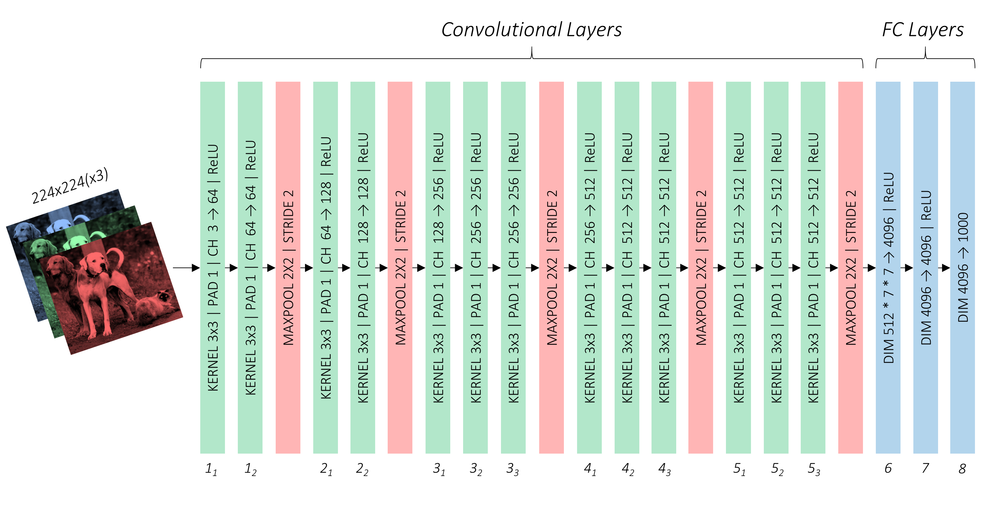
注意以下几点：<br/>
1、输入图片尺寸为300\*300<br/>
2、第三个pooling层，使用ceil，向上取整，而不是四舍五入，这是为了conv3_3的输出特征维度是75/2 = 38为偶数<br/>
3、修正第5个pooling层的kernel从2\*2,s=2为3\*3,s=1 目的是额外层的特征尺寸不再减半<br/>
4、无需全连接层：删除fc8，fc6、fc7均使用卷积层代替<br/>
5、conv6需要使用空洞卷积，dilation rate(空洞参数)为6（kernel的间隔数量），以此放大卷积核的感受野。【引申解释：dilation=3，可以理解为卷积核从3\*3变为7\*7】<br/>




修改后的网络架构图为：

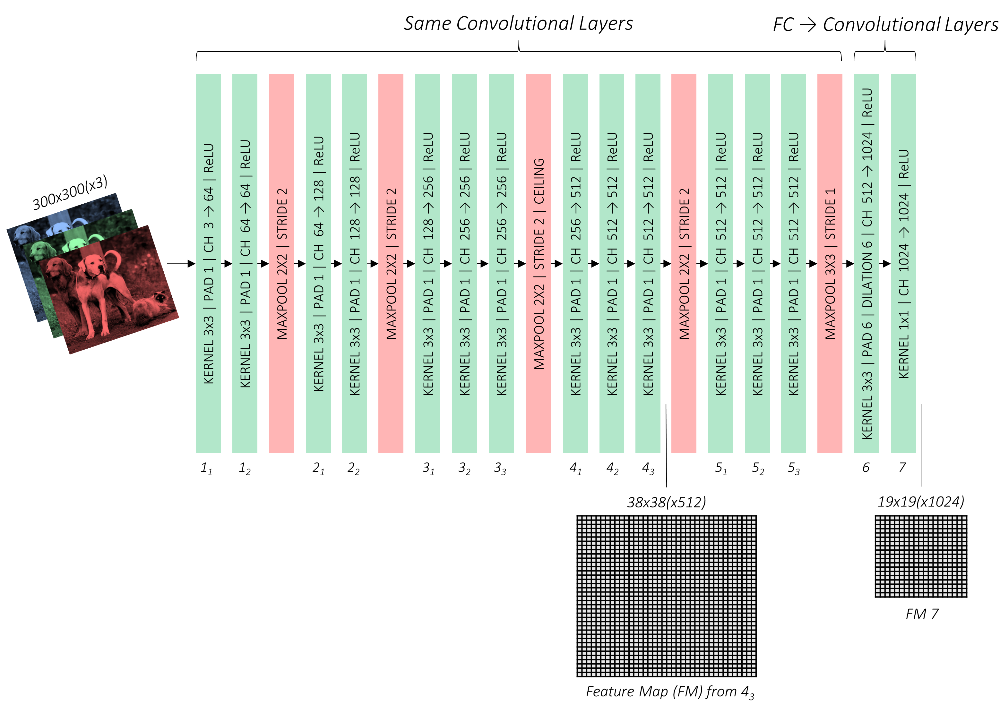

## 1.2 辅助卷积

所谓辅助卷积，就是在basenet之后堆叠一些卷积层，用来产生额外的特征图，每个都比前一个特征图尺寸小<br/>

这些额外的卷积层如下图：
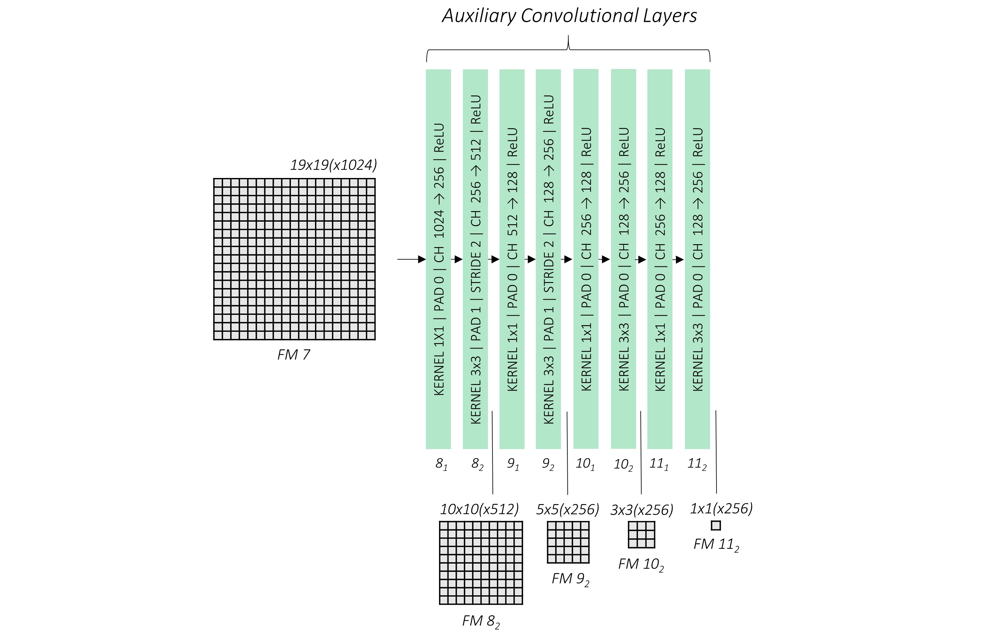


由图可见:<br/>
1、额外添加的模块有4个，每个模块由2个卷积层构成<br/>
2、每个模块的第二层都是使用s=2的3\*3卷积，因此特征尺寸逐一减半<br/>


## 1.3 预设框Priors

关于预设框，作者的设置图如下：<br/>
1、使用不同尺度的6种中间特征图做预测，分别为：conv4_3、conv7、conv8_2、conv9_2、conv10_2、conv11_2、<br/>
2、scale设置：最大特征图conv4_3的scale设置为0.1，剩余的特征图的scale从0.2到0.9线性分割，大特征图具有小scale，目的是为了更好的检测小目标<br/>
3、aspect ratio设置：所有尺度的特征图都具有1:1 1:2 2:1的尺度，conv7 conv8_2 conv9_2具有额外的1:3 3:1 aspect ratio<br/>
4、当aspect raito为1时，增加一个scale，值为当前的scale与下一个scale的几何平均值(sqrt(sk\*sk+1))<br/>

预设框的数量计算如下：

| Feature Map From | Feature Map Dimensions | Prior Scale | Aspect Ratios                            | Number of Priors per Position | Total Number of Priors on this Feature Map |
| ---------------- | ---------------------- | ----------- | ---------------------------------------- | ----------------------------- | ------------------------------------------ |
| `conv4_3`        | 38, 38                 | 0.1         | 1:1, 2:1, 1:2 + an extra prior           | 4                             | 5776                                       |
| `conv7`          | 19, 19                 | 0.2         | 1:1, 2:1, 1:2, 3:1, 1:3 + an extra prior | 6                             | 2166                                       |
| `conv8_2`        | 10, 10                 | 0.375       | 1:1, 2:1, 1:2, 3:1, 1:3 + an extra prior | 6                             | 600                                        |
| `conv9_2`        | 5, 5                   | 0.55        | 1:1, 2:1, 1:2, 3:1, 1:3 + an extra prior | 6                             | 150                                        |
| `conv10_2`       | 3, 3                   | 0.725       | 1:1, 2:1, 1:2 + an extra prior           | 4                             | 36                                         |
| `conv11_2`       | 1, 1                   | 0.9         | 1:1, 2:1, 1:2 + an extra prior           | 4                             | 4                                          |
| **Grand Total**  | –                      | –           | –                                        | –                             | **8732 priors**                            |


通过scale 和 aspect ratio 可以计算出预设框的宽高：
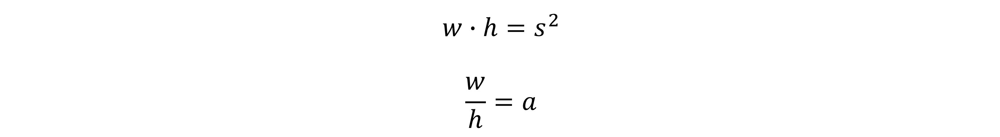


因此，
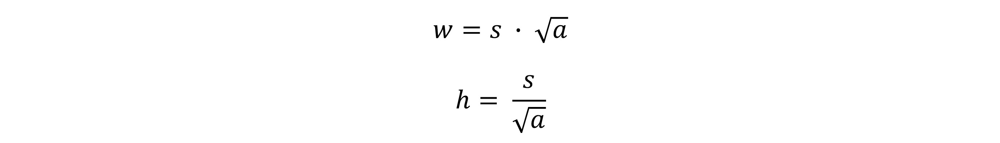

当conv9_2的设置如图
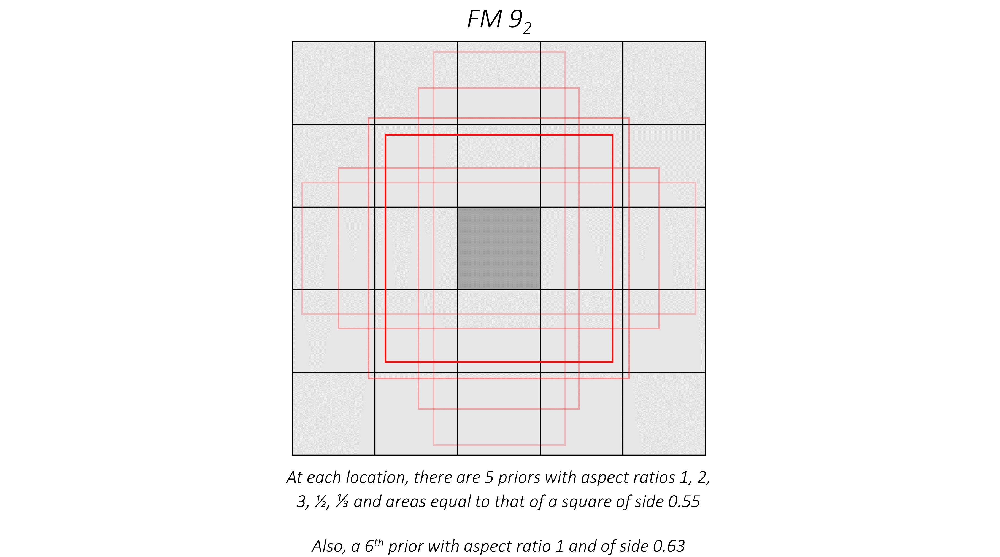

有了预设框，可以通过预设框与实际bbox的偏移量推算实际预测坐标的，二者的关系为：
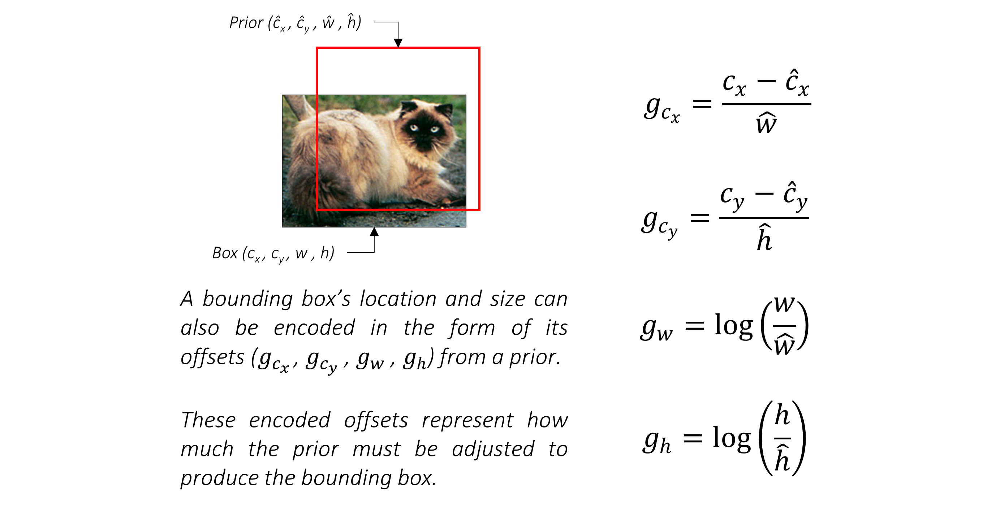




## 1.4 预测卷积

该部分需要完成的工作有两个：<br/>
1、计算bbox的偏移向量(g_c_x, g_c_y, g_w, g_h)<br/>
2、计算n_class 的置信度，包括背景<br/>

只需每层两个卷积层即可完成该操做<br/>
1、3\*3\*4的卷积核计算得出4个位置偏移向量<br/>
2、3\*3\*classes获得类别置信度向量<br/>
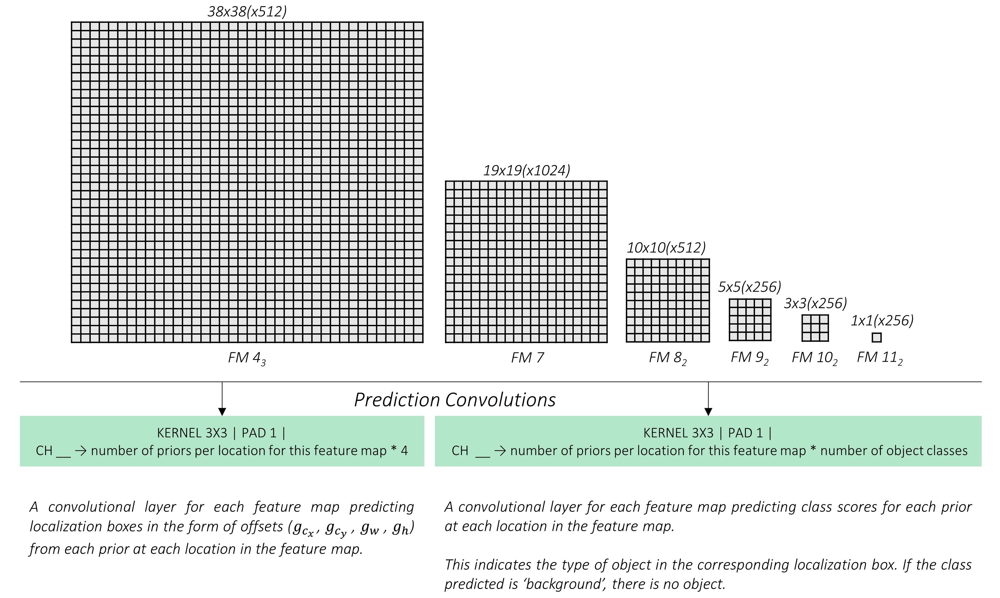

对所有的尺度特征的输出均进行这两个部分的预测

预测阶段最终的输出为8732\*4个偏移量，8732\*类别数量个置信度

## 1.5 Multibox loss
### 偏移损失
1、计算8732个预设框和N个标注目标的所有IOU，输出向量为8732\*N<br/>
2、为每个预设框匹配一个IOU最大的目标，若>0.5，认为是正样本，否则为负样本<br/>

这样一来，每个预设框都有一个gt匹配，要么是正样本，要么是负样本<br/>
正样本即可使用匹配到的gt的坐标来学习，负样本没有坐标

有了这些坐标，就可以计算偏移损失了，这里使用smooth_L1损失
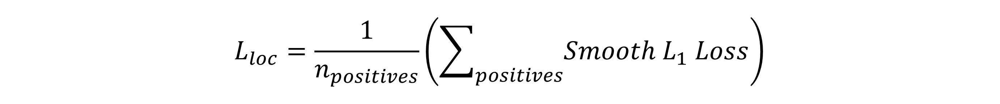

### 置信度损失

作者使用一的一种负采样策略称为：Hard Negative Mining，具体的做法是：<br/>
1、对所有负样本的交叉熵损失进行排序，取最大的3\*N_p个作为负样本<br/>
2、N_p就代表正样本的数量<br/>
最终的置信度所示就是简单的正样本的交叉熵和负样本的交叉熵只和<br/>
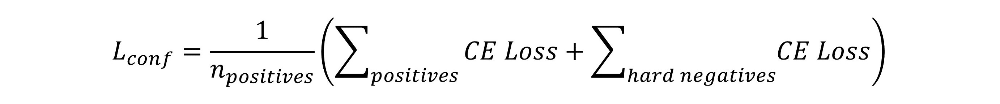

这里被正样本匹配数做了一个平均

### 总的损失
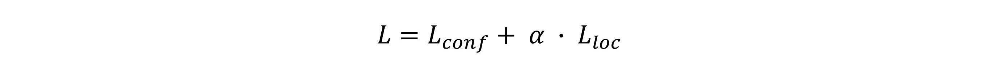
作者设置了α 默认= 1

## 1.6 后处理部分

1、偏移量处理：直接使用模型预测的(g_c_x, g_c_y, g_w, g_h)解码即可得到8732个偏移坐标<br/>
2、类别处理，对于每个非背景类：<br/>
    - 提取该类别的8732个置信度
    - 删除不满足置信度阈值的box
    - 剩下的box为候选bbox

如此获得了大量的重复框，是用NMS算法对每个类别的重复框进行过滤，步骤如下所示：
1、取出所有非背景类别的候选框
2、对每种类别，置信度降序排列
3、得到最高置信度的目标，过滤与其交叠比大于0.5的候选
4、循环直到结束

# 二、实现部分


## 2.1 Dataset

1、数据集中有20个类
{'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor'}<br/>
2、每张图片可能包含多个目标<br/>
3、每个目标有3个部分信息<br/>
- 一个目标坐标的绝对值 bbox
- 标注所属类
- difficulty 1代表困难

4、作者使用VOC2007trainval + VOC2012trainval作为训练数据，VOCtest作为测试数据<br/>

### VOC数据集介绍
全称 The PASCAL Visual Object Classes <br/>

比赛已经于2012年停止举办了，但是仍能提交结果

总共四个大类：vehicle,household,animal,person

总共20个小类，预测的时候是只输出图中黑色粗体的类别

数据集主要关注分类和检测，也就是分类和检测用到的数据集相对规模较大。关于其他任务比如分割，动作识别等，其数据集一般是分类和检测数据集的子集。

VOC2007：2007以前是一个数据集，包含Train/val/Test共9963张，包含24640张已经标注的目标

VOC2012：2012是最后一次比赛，为2008-2012年的所有数据，并与VOC2007互斥；用于分类和检测任务中，train/val共11540张图，包含27450个object

目前广大研究者们普遍使用的是 VOC2007和VOC2012数据集，因为二者是互斥的，不相容的。
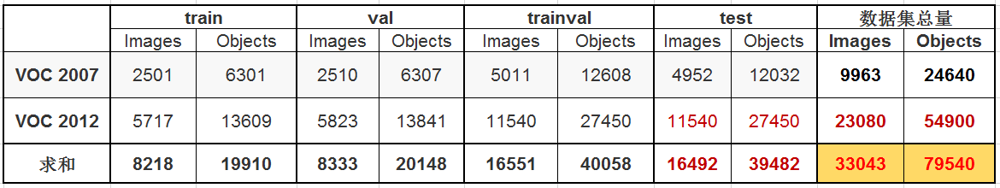

数据集结构

.
├── Annotations 进行detection 任务时的 标签文件，xml文件形式<br/>
├── ImageSets 存放数据集的分割文件，比如train，val，test<br/>
├── JPEGImages 存放 .jpg格式的图片文件<br/>
├── SegmentationClass 存放 按照class 分割的图片<br/>
└── SegmentationObject 存放 按照 object 分割的图片<br/>

#### 代码实现

In [64]:
import os
import xml.etree.ElementTree as ET
import json
from matplotlib import pyplot as plt
%matplotlib inline
import numpy as np


# 类别映射
voc_labels = ('aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable',
              'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor')

label_map = {k:  v+1 for v, k in enumerate(voc_labels)}
label_map['background'] = 0
rev_label_map = {v: k for k, v in label_map.items()}



# xml数据转换为pyuthon类
def parse_annotation(annotation_path):
    tree = ET.parse(annotation_path)
    root = tree.getroot()
    boxes = list()
    labels = list()
    difficulties = list()
    for object in root.iter('object'):
        difficult = int(object.find('difficult').text == '1')
        
        label = object.find('name').text.lower().strip()
        if label not in label_map:
            continue
        bbox = object.find('bndbox')
        x_min = int(bbox.find('xmin').text)-1
        y_min = int(bbox.find('ymin').text)-1
        x_max = int(bbox.find('xmax').text)-1
        y_max = int(bbox.find('ymax').text)-1
        
        boxes.append([x_min, y_min, x_max, y_max])
        labels.append(label_map[label])
        difficulties.append(difficult)
    return {'boxes': boxes, 'labels': labels, 'difficulties': difficulties }

# 解析标注数据
def create_data_lists(voc07_path, voc12_path, output_folder):
    # 创建图片list、目标的bbox和label，并存储到文件
    """
    :param voc07_path: path to the 'VOC2007' folder
    :param voc12_path: path to the 'VOC2012' folder
    :param output_folder: folder where the JSONs must be saved
    """
    voc07_path = os.path.abspath(voc07_path)
    voc12_path = os.path.abspath(voc12_path)
    os.makedirs(output_folder, exist_ok=True)
    
    train_images = list()
    train_objects = list()
    n_objects = 0
    
    # Training data
    for path in [voc07_path, voc12_path]:
    # for path in [voc07_path]:
        # 获取ids
        with open(os.path.join(path, 'ImageSets/Main/trainval.txt')) as f:
            ids = f.read().splitlines()
        for id in ids:
            # 拿到XML文件
            objects = parse_annotation(os.path.join(path, 'Annotations', id + '.xml'))
            if len(objects['boxes']) == 0:
                continue
            n_objects += len(objects)
            train_objects.append(objects)
            train_images.append(os.path.join(path, 'JPEGImages', id+'.jpg'))
    assert len(train_objects) == len(train_images)
    
    # 存储称为文件
    with open(os.path.join(output_folder, 'TRAIN_images.json'), 'w') as j:
        json.dump(train_images, j)
    with open(os.path.join(output_folder, 'TRAIN_objects.json'), 'w') as j:
        json.dump(train_objects, j)
    with open(os.path.join(output_folder, 'label_map.json'), 'w') as j:
        json.dump(label_map, j)
    print('\nThere are %d training images containing a total of %d objects. Files have been saved to %s.' % (
    len(train_images), n_objects, os.path.abspath(output_folder)))
    
    # Test data
    test_images = list()
    test_objects = list()
    n_objects = 0
    
    with open(os.path.join(voc07_path, 'ImageSets/Main/test.txt')) as f:
        ids = f.read().splitlines()
    for id in ids:
        # 解析XML标注文件
        objects = parse_annotation(os.path.join(voc07_path, "Annotations", id+'.xml'))
        if len(objects) == 0:
            continue
        test_objects.append(objects)
        test_images.append(os.path.join(voc07_path, "JPEGImages", id+'.jpg'))

    assert len(test_objects) == len(test_images)
    
    # 存储称为文件
    with open(os.path.join(output_folder, 'TEST_images.json'), 'w') as j:
        json.dump(test_images, j)
    with open(os.path.join(output_folder, 'TEST_objects.json'), 'w') as j:
        json.dump(test_objects, j)
    print('\nThere are %d test images containing a total of %d objects. Files have been saved to %s.' % (
        len(test_images), n_objects, os.path.abspath(output_folder)))      
            
create_data_lists('./data/VOCdevkit/VOC2007/', './data/VOCdevkit/VOC2012/', './data/voc_dealed')


There are 16551 training images containing a total of 49653 objects. Files have been saved to /workspace/handwriten_net/data/voc_dealed.

There are 4952 test images containing a total of 0 objects. Files have been saved to /workspace/handwriten_net/data/voc_dealed.


### 2.2 数据预处理
#### 图片处理

1、resize到300\*300<br/>
2、像素值归一化到0-1<br/>
3、由于使用VGG16的pretrain-weights 需要想Imagenet中归一化图片RGB<br/>
- mean = [0.485, 0.456, 0.406]<br/>
- std = [0.229, 0.224, 0.225]<br/>
4、图片必须是Float tensor的NCWH 形状

#### BBoxes处理
1、处理成为N_o\*4的维度，4代表相对坐标，元素为Float Tensor<br/>
2、格式为xmin ymin xmax ymax<br/>
#### Objects' Labels
1、使用1-20代表类别<br/>
2、使用0代表背景类<br/>
处理称为N_o长度的Long tensor<br/>

#### 代码实现

In [130]:
import random
random.seed(11)
from PIL import Image
import torch
from torch.utils.data import Dataset
from torchvision.transforms import functional as FT

debug  = False


def find_intersection(set_1, set_2):
    # 计算两个set的相交面积 利用pytorch的自动广播机制
    lower_bounds = torch.max(set_1[:, :2].unsqueeze(1), set_2[:, :2].unsqueeze(0))  # (n1 n2 2)
    upper_bounds = torch.min(set_1[:, 2:].unsqueeze(1), set_2[:, 2:].unsqueeze(0))  # (n1 n2 2)
    intersection_dims = torch.clamp(upper_bounds - lower_bounds, min=0)             # (n1, n2, 2)
    return intersection_dims[:, :, 0] * intersection_dims[:, :, 1]   # (n1, n2)
 

def find_jaccard_overlap(set_1, set_2):
    """
    计算IOU
    :param set_1: set 1, a tensor of dimensions (n1, 4)
    :param set_2: set 2, a tensor of dimensions (n2, 4)
    return dimensions (n1, n2)
    """
    # 计算交叠面积
    intersection = find_intersection(set_1, set_2)
    
    # 计算每个box的面积
    areas_set_1 = (set_1[:, 2]-set_1[:, 0]) * (set_1[:, 3]-set_1[:, 1])
    areas_set_2 = (set_2[:, 2]-set_2[:, 0]) * (set_2[:, 3]-set_2[:, 1])
    
    # 计算重叠面积
    # 注意 这里使用pytorch的自动广播机制
    union = areas_set_1.unsqueeze(1)+areas_set_2.unsqueeze(0)-intersection # (n1, n2)
    return intersection / union


# 一系列的光学扭曲，50%概率出现
def photometric_distort(image):
    # 扭曲 亮度、对比度、饱和度、色调等
    # 触发概率50% 随机
    new_image = image
    
    distortions = [FT.adjust_brightness,   # 亮度
                  FT.adjust_contrast,      # 对比度
                  FT.adjust_saturation,    # 饱和度
                  FT.adjust_hue]           # 色调
    random.shuffle(distortions)
    for d in distortions:
        if random.random() < 0.5:
            if d.__name__ is "adjust_hue":
                adjust_factor = random.uniform(-18/255., 18/255.)
            else:
                adjust_factor = random.uniform(0.5, 1.5)
            
            # 应用
            new_image = d(new_image, adjust_factor)

    return new_image
                
# 膨胀图片，50%概率出现，为了检测小目标；使用mean作为填充
def expand(image, boxes, filler):
    """
    :param filler: 填充元素的RGB 值，list类型[R, G, B]
    """
    # 计算图片维度
    original_h = image.size(1)
    original_w = image.size(2)
    # 计算放大之后的图片尺寸 ， 最大比例为4倍
    max_scale = 4
    scale = random.uniform(1, max_scale)
    new_h = int(scale * original_h)
    new_w = int(scale * original_w)
    
    # 使用该fillerc创建一个图片
    filler = torch.FloatTensor(filler)
    new_image = torch.ones((3, new_h, new_w), dtype=torch.float) * filler.unsqueeze(1).unsqueeze(1)
    # 注意，不用使用new_image=filler.unqueeze(1).unsqueeze(1).expand(3, new_h, new_w)
    # 因为所有的zoom值将会使用相同的内存，改变一个像素将会改变所有
    
    # 随机选取一个部分
    left = random.randint(0, new_w - original_w)
    right = left + original_w
    top = random.randint(0, new_h - original_h)
    bottom = top + original_h
    new_image[:, top: bottom, left: right] = image

    # 调整 bbox
    new_boxes = boxes + torch.FloatTensor([left, top, left, top]).unsqueeze(0)
    return new_image, new_boxes
    
    
# 随机裁剪
def random_crop(image, boxes, labels, difficulties):
    """
    以原文的方式进行随机裁剪，目的是学习大目标，和半个目标
    一些目标可能会被完全切割出去
    """
    original_h = image.size(1)
    original_w = image.size(2)
    
    # 不断的选取一小部分交叠，直到成功切割
    while True:
        # 随机选取一个最小交叠值
        min_overlap = random.choice([0., .1, .3, .5, .7, .9, None]) # None意思是不切割
        if min_overlap is None:
            return image, boxes, labels, difficulties

        # 如果50次还没成功就放弃了，也是从作者的caffe源码中获得
        max_trials = 50
        for _ in range(max_trials):
            # 裁剪的尺寸必须是原始尺寸的[0.3, 1]之间
            # 原文是[0.1, 1]
            min_scale = 0.3
            scale_h = random.uniform(min_scale, 1)
            scale_w = random.uniform(min_scale, 1)
            new_h = int(scale_h * original_h)
            new_w = int(scale_w * original_w)
            
            # 裁剪后的长宽比控制在0.5-2
            aspect_ratio = new_h / new_w
            if not 0.5 < aspect_ratio < 2:
                continue
            
            # 裁剪坐标
            left = random.randint(0, original_w-new_w)
            right = left + new_w
            top = random.randint(0, original_h-new_h)
            bottom = top + new_h
            crop = torch.FloatTensor([left, top, right, bottom])
            
            # 计算裁剪后的图片与bbox的交叠比
            overlap = find_jaccard_overlap(crop.unsqueeze(0), boxes)
            overlap = overlap.squeeze(0)
            # 如果没有一个交叠比大于阈值，continue
            if overlap.max().item() < min_overlap:
                continue
                
            # 裁剪图片
            new_image = image[:, top:bottom, left:right]  
            
            # 找到原始bbox的中心
            bb_certers = (boxes[:, :2]+boxes[:, 2:]) / 2.
            
            # 找到bbox中心在裁剪种的bbox
            center_in_crop = (bb_certers[:, 0] > left) * (bb_certers[:, 0] < right) * (bb_certers[:, 1] > top) * (bb_certers[:, 1]<bottom)
            
            # 如果没有bbox在中心 continue
            if not center_in_crop.any():
                continue
            
            # 过滤不再中心的bbox
            new_boxes = boxes[center_in_crop, :]
            new_labels = labels[center_in_crop]
            new_difficulties = difficulties[center_in_crop]
            
            # 计算bbox的新坐标
            new_boxes[:, :2] = torch.max(new_boxes[:, :2], crop[:2])
            new_boxes[:, :2] -= crop[:2]  
            new_boxes[:, 2:] = torch.min(new_boxes[:, 2:], crop[2:])
            new_boxes[:, 2:] -= crop[:2]
            
            return new_image, new_boxes, new_labels, new_difficulties
        
def flip(image, boxes):
    """
    水平翻转
    """
    # 翻转图片
    new_image = FT.hflip(image)
    
    # 翻转bbox
    new_boxes = boxes  # xmin ymin xmax ymax
    new_boxes[:, 0] = torch.clamp(image.width - boxes[:, 0] - 1, min=0)
    new_boxes[:, 2] = torch.clamp(image.width - boxes[:, 2] - 1, min=0)
    new_boxes = new_boxes[:, [2, 1, 0, 3]]
    return new_image, new_boxes
    
def resize(image, boxes, dims=(300, 300), return_percent_coords=True):
    """
    resize 到 300*300
    """
    new_image = FT.resize(image, dims)
    
    old_dims = torch.FloatTensor([image.width, image.height, image.width, image.height]).unsqueeze(0)
    new_boxes = boxes / old_dims

    if not return_percent_coords:
        new_dims = torch.FloatTensor([dims[1], dims[0], dims[1], dims[0]]).unsqueeze(0)
        new_boxes = new_boxes * new_dims
    return new_image, new_boxes



# 数据增强
def transform(image, boxes, labels, difficulties, split):
    """
    应用以上提到的数据增强
    :param image: 图片, a PIL Image
    :param boxes: bounding boxes in boundary coordinates, a tensor of dimensions (n_objects, 4)
    :param labels: labels of objects, a tensor of dimensions (n_objects)
    :param difficulties: difficulties of detection of these objects, a tensor of dimensions (n_objects)
    :param split: one of 'TRAIN' or 'TEST', since different sets of transformations are applied
    :return: transformed image, transformed bounding box coordinates, transformed labels, transformed difficulties
    """
    assert split in {"TRAIN", "TEST"}
    
    # 均值标准差均使用ImageNet比赛的
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]

    new_image = image
    new_boxes = boxes
    new_labels = labels
    new_difficulties = difficulties
    
    # 训练数据增强
    if split == 'TRAIN':
        # 一系列的光学扭曲，50%概率出现
        if debug:
            plt.imshow(new_image)
            plt.title('original')
            plt.show()
            print('new_boxes', new_boxes)
            print('label', new_labels)
            print('difficulties', new_difficulties)
        new_image = photometric_distort(new_image)
        if debug:
            plt.imshow(new_image)
            plt.title('photometric_distort')
            plt.show()
            print('new_boxes', new_boxes)
            print('label', new_labels)
            print('difficulties', new_difficulties)

        # PIL转tensor 
        # NOTICE ！！！这里面直接把0-255变成了0-1之间
        new_image = FT.to_tensor(new_image)

        # 膨胀图片，50%概率出现，为了检测小目标；使用mean作为填充
        if random.random() < 0.5:
            new_image, new_boxes = expand(new_image, boxes, filler=mean)
            if debug:
                plt.imshow(FT.to_pil_image(new_image))
                plt.title('expand')
                plt.show()
                print('new_boxes', new_boxes)
            
        # 随机裁剪
        new_image, new_boxes, new_labels, new_difficulties = random_crop(new_image, new_boxes, new_labels, new_difficulties)
        if debug:
            plt.imshow(FT.to_pil_image(new_image))
            plt.title('random_crop')
            plt.show()
            print('new_boxes',new_boxes)
            print('new_labels',new_labels)
            print('new_difficulties',new_difficulties)
            
        # 转PIL图片
        new_image = FT.to_pil_image(new_image)  # 这里又从0-1变为了0-255
        
        # 水平翻转
        if random.random() < 0.5:
            new_image, new_boxes = flip(new_image, new_boxes)
            if debug:
                plt.imshow(new_image)
                plt.title('flip')
                plt.show()
                print('new_boxes', new_boxes)
        
    # 将图片放缩到300*300
    new_image, new_boxes = resize(new_image, new_boxes, dims=(300, 300))
    if debug:
        plt.imshow(new_image)
        plt.title('resize')
        plt.show()
        print(new_image)
        print('new_boxes', new_boxes)

    # 转tensor
    new_image = FT.to_tensor(new_image)

    # 归一化 ImageNet VGG16的方式
    new_image = FT.normalize(new_image, mean=mean, std=std)
    return new_image, new_boxes, new_labels, new_difficulties
        


In [66]:
# 建立一个Datasets类，用作Pytorch的dataloader
class PasacalVOCDataset(Dataset):
    
    def __init__(self, data_folder, split, keep_difficult=False):
        """
        split = TRAIN  or TEST
        """
        self.split = split.upper()
        assert self.split in ['TRAIN', 'TEST']
        self.data_floder = data_folder
        self.keep_difficult = keep_difficult
        
        # 读取数据
        with open(os.path.join(data_folder, self.split+'_images.json'), 'r') as j:
            self.images = json.load(j)
        with open(os.path.join(data_folder, self.split+'_objects.json'), 'r') as j:
            self.objects = json.load(j)
        
        assert len(self.images) == len(self.objects)
    
    def __getitem__(self, i):
        # 读图片
        image = Image.open(self.images[i], mode='r')
        image = image.convert('RGB')
        
        # 读取objects
        objects = self.objects[i]
        boxes = torch.FloatTensor(objects['boxes']) # N*4
        labels = torch.LongTensor(objects['labels'])  # N
        difficulties = torch.ByteTensor(objects['difficulties'])  # N
        
        if not self.keep_difficult:
            boxes = boxes[1-difficulties]
            labels = labels[1-difficulties]
            difficulties = difficulties[1-difficulties]
        # 应用数据增强
        image, boxes, labels, difficulties = transform(image, boxes, labels, difficulties, split=self.split)
        return image, boxes, labels, difficulties
        
        
        
    def __len__(self):
        return len(self.images)

    def collate_fn(self, batch):
        """
        该方法会被传递到Dataloader
        作用是组合不同尺寸的Tensor
        
        """
        images = list()
        boxes = list()
        labels = list()
        difficulties = list()
        
        for b in batch:
            images.append(b[0])
            boxes.append(b[1])
            labels.append(b[2])
            difficulties.append(b[3])
        images = torch.stack(images, dim=0)
        return images, boxes, labels, difficulties
    
    

In [67]:
# 验证一下
data_folder = './data/voc_dealed/'
split = 'TRAIN'
pasacalVOCDataset = PasacalVOCDataset(data_folder, split, keep_difficult=False)
print("总长度", len(pasacalVOCDataset))
i = 0
for item in pasacalVOCDataset:
    i+=1 
    if i == 9:
        image, boxes, labels, difficulties = item
        print('the shape of image', image.size(), image.device)
        print('the shape of boxes', boxes.size(), boxes)
        print('the shape of labels', labels.size(), labels)
        print('the shape of difficulties', difficulties.size(), difficulties)

        break



总长度 16551


/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype

the shape of image torch.Size([3, 300, 300]) cpu
the shape of boxes torch.Size([4, 4]) tensor([[0.4825, 0.5402, 0.6268, 0.6222],
        [0.6491, 0.4335, 0.7496, 0.6726],
        [0.5183, 0.4582, 0.6172, 0.6099],
        [0.4904, 0.5113, 0.5949, 0.6388]])
the shape of labels torch.Size([4]) tensor([12, 15, 15, 15])
the shape of difficulties torch.Size([4]) tensor([0, 0, 0, 0], dtype=torch.uint8)


/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.
/pytorch/aten/src/ATen/native/IndexingUtils.h:20: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead.


### 2.3 网络搭建
#### basenet
使用ImageNet预训练的vgg16

In [68]:
from torch import nn
import torchvision
import torch.nn.functional as F
from math import sqrt
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def decimate(tensor, m):
    """
    Decimate a tensor by a factor 'm', i.e. 
    每第m个值进行一次下采样.
    This is used when we convert FC layers to equivalent Convolutional layers, BUT of a smaller size.
    
    :param tensor: tensor to be decimated
    :param m: list of decimation factors for each dimension of the tensor; None if not to be decimated along a dimension
    :return: decimated tensor
    """
    assert tensor.dim() == len(m)
    for d in range(tensor.dim()):
        if m[d] is not None:
            tensor = tensor.index_select(dim=d,
                                         index=torch.arange(start=0, end=tensor.size(d), step=m[d]).long())

    return tensor



class VGGBase(nn.Module):
    """
    VGG base conv 用来提取低级别特征
    """
    def __init__(self):
        super(VGGBase, self).__init__()
        
        # VGG16中的标准卷积层 
        # 300*300
        self.conv1_1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv1_2 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # 150*150
        self.conv2_1 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv2_2 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # 75*75
        self.conv3_1 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv3_2 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.conv3_3 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2 , ceil_mode=True)  # 注意ceil默认为False
        
        # 38*38
        self.conv4_1 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.conv4_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv4_3 = nn.Conv2d(512, 512, kernel_size=3 ,padding=1)
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # 19*19 注意第5个通道没有翻倍
        self.conv5_1 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_2 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.conv5_3 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
         # 注意这里s变为1,kerkel变为3，需要使用padding=1
        self.pool5 = nn.MaxPool2d(kernel_size=3 , stride=1, padding=1)  
        
        # 19*19，fc6替换为conv6，空洞(strous)卷积，dilation=6 为了保持尺寸不变，padding也需要为6
        self.conv6 = nn.Conv2d(512, 1024, kernel_size=3, padding=6, dilation=6) 
        # fc7替换为conv7
        self.conv7 = nn.Conv2d(1024, 1024, kernel_size=1)
        
        # 加载预训练参数
        self.load_pretrain_layers()

    def forward(self, image):
        """
        return conv4_3 conv7的特征图
        """
        out = F.relu(self.conv1_1(image))  # N 3 300 300
        out = F.relu(self.conv1_2(out))    # N 64 300 300
        out = self.pool1(out)              # N 64 150 150
        
        out = F.relu(self.conv2_1(out))           # N 128 150 150
        out = F.relu(self.conv2_2(out))           # N 128 150 150
        out = self.pool2(out)  # N 128 75 75
        
        out = F.relu(self.conv3_1(out))  # N 256 75 75
        out = F.relu(self.conv3_2(out))  # N 256 75 75
        out = F.relu(self.conv3_3(out))  # N 256 75 75
        out = self.pool3(out)  # N 256 38 38
        
        out = F.relu(self.conv4_1(out))  # N 512 38 38
        out = F.relu(self.conv4_2(out))  # N 512 38 38
        out = F.relu(self.conv4_3(out))  # N 512 38 38
        conv4_3_feats = out
        out = self.pool4(out)  # N 512 19 19
        
        out = F.relu(self.conv5_1(out))  # N 512 19 19
        out = F.relu(self.conv5_2(out))  # N 512 19 19
        out = F.relu(self.conv5_3(out))  # N 512 19 19
        out = self.pool5(out)  # N 512 19 19
        
        out = F.relu(self.conv6(out))  # N 1024 19 19
        out = F.relu(self.conv7(out))  # N 1024 19 19
        conv7_feats = out

        return conv4_3_feats, conv7_feats
        
        
        
    def load_pretrain_layers(self):
        
        state_dict = self.state_dict()
        param_names = list(state_dict.keys())
        
        pretrained_state_dict = torchvision.models.vgg16(pretrained=True).state_dict()
        pretrained_param_names = list(pretrained_state_dict.keys())
        # print(pretrained_param_names)
        # conv1-5直接加载即可
        for i, param in enumerate(param_names[: -4]):  # 除去conv6-7的w b 
            state_dict[param] = pretrained_state_dict[pretrained_param_names[i]]

        # conv6、conv7使用fc的参数转化
        conv_fc6_weight = pretrained_state_dict['classifier.0.weight'].view(4096, 512, 7, 7)  # (4096, 512, 7, 7)
        conv_fc6_bias = pretrained_state_dict['classifier.0.bias']  # 4096
        state_dict['conv6.weight'] = decimate(conv_fc6_weight, m=[4, None, 3, 3])  # 512 1024 3 3
        state_dict['conv6.bias'] = decimate(conv_fc6_bias, m=[4])  # (1024)

        conv_fc7_weight = pretrained_state_dict['classifier.3.weight'].view(4096, 4096, 1, 1)  
        conv_fc7_bias = pretrained_state_dict['classifier.3.bias'] # 4096
        state_dict['conv7.weight'] = decimate(conv_fc7_weight, m=[4, 4, None, None])  # 1024 1024 1 1
        state_dict['conv7.bias'] = decimate(conv_fc7_bias, m=[4])  # (1024)
        
        self.load_state_dict(state_dict)
#         print("\nLoaded base model.\n")

In [69]:
# 检查一下模型结构
model = VGGBase()
x = torch.rand(2, 3, 300, 300, dtype=torch.float)  # N 3 300 300
conv4_3_feats, conv7_feats = model(x)
print(conv4_3_feats.size(), conv7_feats.size())


torch.Size([2, 512, 38, 38]) torch.Size([2, 1024, 19, 19])


#### Auxiliary Convolutions
额外的卷积层

使用 uniform Xavier initialization 进行初始化



In [70]:

class AuxiliaryConvolutions(nn.Module):
    def __init__(self):
        super(AuxiliaryConvolutions, self).__init__()    
        # 在vgg的top额外添加的卷积层
        self.conv8_1 = nn.Conv2d(1024, 256, kernel_size=1, padding=0)
        self.conv8_2 = nn.Conv2d(256, 512, kernel_size=3, padding=1, stride=2)
        
        self.conv9_1 = nn.Conv2d(512, 128, kernel_size=1, padding=0)
        self.conv9_2 = nn.Conv2d(128, 256, kernel_size=3, padding=1, stride=2)  # 卷积核的ceil mode默认是向上的
        
        self.conv10_1 = nn.Conv2d(256, 128, kernel_size=1, padding=0)
        self.conv10_2 = nn.Conv2d(128, 256, kernel_size=3, padding=0)
        
        self.conv11_1 = nn.Conv2d(256, 128, kernel_size=1, padding=0)
        self.conv11_2 = nn.Conv2d(128, 256, kernel_size=3, padding=0)
        
        self.init_conv2d()
    
    def init_conv2d(self):
        """
        初始化卷积参数
        """
        for c in self.children():
            if isinstance(c, nn.Conv2d):
                nn.init.xavier_uniform_(c.weight)
                nn.init.constant_(c.bias, 0.)
    
    def forward(self, conv7_feats):
        # conv7_feats  N 1024 19 19
        out = F.relu(self.conv8_1(conv7_feats))  # N 256 19 19
        out = F.relu(self.conv8_2(out))  # N 512 10 10
        conv8_2_feats = out
        
        out = F.relu(self.conv9_1(out))  # N 128 10 10
        out = F.relu(self.conv9_2(out))  # N 256 5 5
        conv9_2_feats = out
        
        out = F.relu(self.conv10_1(out))  # N 128 5 5
        out = F.relu(self.conv10_2(out))  # N 256 3 3
        conv10_2_feats = out
        
        out = F.relu(self.conv11_1(out))  # N 128 3 3
        out = F.relu(self.conv11_2(out))  # N 256 1 1
        conv11_2_feats = out
        return conv8_2_feats, conv9_2_feats, conv10_2_feats, conv11_2_feats

In [71]:
# 检查一下AuxiliaryConvolutions的网络结构
aux_net = AuxiliaryConvolutions()
conv8_2_feats, conv9_2_feats, conv10_2_feats, conv11_2_feats = aux_net.forward(conv7_feats)
for feats in [conv8_2_feats, conv9_2_feats, conv10_2_feats, conv11_2_feats]:
    print(feats.size())




torch.Size([2, 512, 10, 10])
torch.Size([2, 256, 5, 5])
torch.Size([2, 256, 3, 3])
torch.Size([2, 256, 1, 1])


#### Prediction Convolutions

检测器，用于生成位置和类别预测

1、初始化方式类似Auxiliary Convolutions

2、最终把所有的结果stack到七个tensor中

3、最终的位置和类别信息的tensor 应该是8732个， 分别为4、21维

In [72]:
class PredictionConvolutions(nn.Module):
    def __init__(self, n_classes):
        super(PredictionConvolutions, self).__init__()
        
        self.n_classes = n_classes
        
        # 预设框的数量分布
        n_boxes = {
            'conv4_2': 4,
            'conv7': 6,
            'conv8_2': 6,
            'conv9_2': 6,
            'conv10_2': 4,
            'conv11_2': 4    
        }
        
        # aspect ratio设置
        # 位置预测的卷积
        self.loc_conv4_3 = nn.Conv2d(512, n_boxes['conv4_2']*4, kernel_size=3, padding=1)
        self.loc_conv7 = nn.Conv2d(1024, n_boxes['conv7']*4, kernel_size=3, padding=1)
        self.loc_conv8_2 = nn.Conv2d(512, n_boxes['conv8_2']*4, kernel_size=3, padding=1)
        self.loc_conv9_2 = nn.Conv2d(256, n_boxes['conv9_2']*4, kernel_size=3, padding=1)
        self.loc_conv10_2 = nn.Conv2d(256, n_boxes['conv10_2']*4, kernel_size=3, padding=1)
        self.loc_conv11_2 = nn.Conv2d(256, n_boxes['conv11_2']*4, kernel_size=3, padding=1)
        
        # 类别预测卷积
        self.cl_conv4_3 = nn.Conv2d(512, n_boxes['conv4_2']*self.n_classes, kernel_size=3, padding=1)
        self.cl_conv7 = nn.Conv2d(1024, n_boxes['conv7']*self.n_classes, kernel_size=3, padding=1)
        self.cl_conv8_2 = nn.Conv2d(512, n_boxes['conv8_2']*self.n_classes, kernel_size=3, padding=1)
        self.cl_conv9_2 = nn.Conv2d(256, n_boxes['conv9_2']*self.n_classes, kernel_size=3, padding=1)
        self.cl_conv10_2 = nn.Conv2d(256, n_boxes['conv10_2']*self.n_classes, kernel_size=3, padding=1)
        self.cl_conv11_2 = nn.Conv2d(256, n_boxes['conv11_2']*self.n_classes, kernel_size=3, padding=1)
        
        # 初始化权重
        self.init_conv2d()
    
    def init_conv2d(self):
        for c in self.children():
            if isinstance(c, nn.Conv2d):
                nn.init.xavier_normal_(c.weight)
                nn.init.constant_(c.bias, 0.)
    
    def forward(self, conv4_3_feats, conv7_feats, conv8_2_feats, conv9_2_feats, conv10_2_feats, conv11_2_feats):
        """
        return : 每张图预测  8732个 location和cat scores
        """
        batch_size = conv4_3_feats.size(0)
        # 预测位置 (与预设框的offset)
        l_conv4_3 = self.loc_conv4_3(conv4_3_feats)  # N 16 38 38
        l_conv4_3 = l_conv4_3.permute(0, 2, 3, 1).contiguous()  # N 38 38 16 拍平以匹配预设框；permute用于改变维度；contiguous()用于内存生效
        l_conv4_3 = l_conv4_3.view(batch_size, -1, 4)  # N 5776 4 说明该层特征图共有5776个预设框与之对应
        
        l_conv7 = self.loc_conv7(conv7_feats)  # N 24 19 19
        l_conv7 = l_conv7.permute(0, 2, 3, 1).contiguous()
        l_conv7 = l_conv7.view(batch_size, -1, 4)  # N 2166 4
        l_conv8_2 = self.loc_conv8_2(conv8_2_feats)  # N 24 10 10
        l_conv8_2 = l_conv8_2.permute(0, 2, 3, 1).contiguous()
        l_conv8_2 = l_conv8_2.view(batch_size, -1 , 4)  # N 600 4
        
        l_conv9_2 = self.loc_conv9_2(conv9_2_feats)  # N 24 5 5 
        l_conv9_2 = l_conv9_2.permute(0, 2, 3, 1).contiguous()
        l_conv9_2 = l_conv9_2.view(batch_size, -1 , 4)  # N 150 4
        
        l_conv10_2 = self.loc_conv10_2(conv10_2_feats)  # N 16 3 3 
        l_conv10_2 = l_conv10_2.permute(0, 2, 3, 1).contiguous()
        l_conv10_2 = l_conv10_2.view(batch_size, -1 , 4)  # N 36 4

        l_conv11_2 = self.loc_conv11_2(conv11_2_feats)  # N 16 1 1 
        l_conv11_2 = l_conv11_2.permute(0, 2, 3, 1).contiguous()
        l_conv11_2 = l_conv11_2.view(batch_size, -1 , 4)  # N 4 4
        
        # 预测类别置信度
        c_conv4_3 = self.cl_conv4_3(conv4_3_feats)  # N 84 38 38 
        c_conv4_3 = c_conv4_3.permute(0, 2, 3, 1).contiguous()  # N 38 38 84
        c_conv4_3 = c_conv4_3.view(batch_size, -1, self.n_classes)  # N 5776 21
        
        c_conv7 = self.cl_conv7(conv7_feats)  # (N, 6 * n_classes, 19, 19)
        c_conv7 = c_conv7.permute(0, 2, 3, 1).contiguous()  # (N, 19, 19, 6 * n_classes)
        c_conv7 = c_conv7.view(batch_size, -1,
                               self.n_classes)  # (N, 2166, n_classes), there are a total 2116 boxes on this feature map

        c_conv8_2 = self.cl_conv8_2(conv8_2_feats)  # (N, 6 * n_classes, 10, 10)
        c_conv8_2 = c_conv8_2.permute(0, 2, 3, 1).contiguous()  # (N, 10, 10, 6 * n_classes)
        c_conv8_2 = c_conv8_2.view(batch_size, -1, self.n_classes)  # (N, 600, n_classes)

        c_conv9_2 = self.cl_conv9_2(conv9_2_feats)  # (N, 6 * n_classes, 5, 5)
        c_conv9_2 = c_conv9_2.permute(0, 2, 3, 1).contiguous()  # (N, 5, 5, 6 * n_classes)
        c_conv9_2 = c_conv9_2.view(batch_size, -1, self.n_classes)  # (N, 150, n_classes)

        c_conv10_2 = self.cl_conv10_2(conv10_2_feats)  # (N, 4 * n_classes, 3, 3)
        c_conv10_2 = c_conv10_2.permute(0, 2, 3, 1).contiguous()  # (N, 3, 3, 4 * n_classes)
        c_conv10_2 = c_conv10_2.view(batch_size, -1, self.n_classes)  # (N, 36, n_classes)

        c_conv11_2 = self.cl_conv11_2(conv11_2_feats)  # (N, 4 * n_classes, 1, 1)
        c_conv11_2 = c_conv11_2.permute(0, 2, 3, 1).contiguous()  # (N, 1, 1, 4 * n_classes)
        c_conv11_2 = c_conv11_2.view(batch_size, -1, self.n_classes)  # (N, 4, n_classes)

        # 总计8732个boxes
        # 注意 这里顺序不能改变 在第 1 维度进行concate
        locs = torch.cat([l_conv4_3, l_conv7, l_conv8_2, l_conv9_2, l_conv10_2, l_conv11_2], dim=1)  # N 8732 4
        classes_scores = torch.cat([c_conv4_3, c_conv7, c_conv8_2, c_conv9_2, c_conv10_2, c_conv11_2], dim=1)
        
        return locs, classes_scores
    

In [73]:
# 检查一下Predictions_conv的网络结构

pred_net = PredictionConvolutions(n_classes=21)
locs, classes_scores = pred_net(conv4_3_feats, conv7_feats, conv8_2_feats, conv9_2_feats, conv10_2_feats, conv11_2_feats)
print('the shape of locs: ', locs.size())  # N 8732 4
print('the shape of classes_scores: ', classes_scores.size())  # N 8732 21


the shape of locs:  torch.Size([2, 8732, 4])
the shape of classes_scores:  torch.Size([2, 8732, 21])


#### SSD300拼接

有了以上的三个部分：basenet、auxiliary net、predict convlution

将这三个部分拼接即可得到SSD算法

这里有一个小细节，conv4_3的特征可能与后面更高级别的特征不是一个数字特征分布，因此坐着在conv4_3上，使用了L2-normalizing 并加入可学习的归一化参数

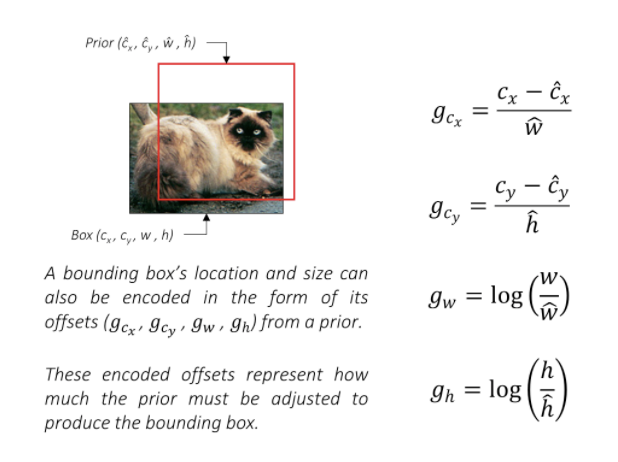

In [74]:
# 4个工具方法
def gcxgcy_to_cxcy(gcxgcy, priors_cxcy):  # 8732 4 fraction coordinates
    """
    使用之前提到的公式解码模型预测的坐标
    公式为上图
    gcxgcy: (n_prioris 4)
    priors_cxcy: (n_prioris 4)
    return  (n_priors, 4)
    """
    return torch.cat([gcxgcy[:, :2] * priors_cxcy[:, 2:] / 10 + priors_cxcy[:, :2],  # c_x, c_y
                      torch.exp(gcxgcy[:, 2:] / 5) * priors_cxcy[:, 2:]], 1)  # w, h
    
def cxcy_to_gcxgcy(cxcy, priors_cxcy):
    """
    Encode bounding boxes (that are in center-size form) w.r.t. the corresponding prior boxes (that are in center-size form).

    For the center coordinates, find the offset with respect to the prior box, and scale by the size of the prior box.
    For the size coordinates, scale by the size of the prior box, and convert to the log-space.

    In the model, we are predicting bounding box coordinates in this encoded form.

    :param cxcy: bounding boxes in center-size coordinates, a tensor of size (n_priors, 4)
    :param priors_cxcy: prior boxes with respect to which the encoding must be performed, a tensor of size (n_priors, 4)
    :return: encoded bounding boxes, a tensor of size (n_priors, 4)
    """

    # The 10 and 5 below are referred to as 'variances' in the original Caffe repo, completely empirical
    # They are for some sort of numerical conditioning, for 'scaling the localization gradient'
    # See https://github.com/weiliu89/caffe/issues/155
    return torch.cat([(cxcy[:, :2] - priors_cxcy[:, :2]) / (priors_cxcy[:, 2:] / 10),  # g_c_x, g_c_y
                      torch.log(cxcy[:, 2:] / priors_cxcy[:, 2:]) * 5], 1)  # g_w, g_h

    
    
def cxcy_to_xy(cxcy):
    """
    (c_x, c_y, w, h)  转化为 (x_min, y_min, x_max, y_max)
    :param: cxcy: (n_boxes, 4)
    :return: (n_boxes, 4)
    """
    
    return torch.cat([cxcy[:, :2] - (cxcy[:, 2:] / 2),  # x_min, y_min
                      cxcy[:, :2] + (cxcy[:, 2:] / 2)], 1)
    
def xy_to_cxcy(xy):
    """
    Convert bounding boxes from boundary coordinates (x_min, y_min, x_max, y_max) to center-size coordinates (c_x, c_y, w, h).

    :param xy: bounding boxes in boundary coordinates, a tensor of size (n_boxes, 4)
    :return: bounding boxes in center-size coordinates, a tensor of size (n_boxes, 4)
    """
    return torch.cat([(xy[:, 2:] + xy[:, :2]) / 2,  # c_x, c_y
                      xy[:, 2:] - xy[:, :2]], 1)  # w, h

In [94]:
class SSD300(nn.Module):
    
    def __init__(self, n_classes):
        super(SSD300, self).__init__()
        self.n_classes = n_classes
        
        self.base = VGGBase()
        self.aux_convs = AuxiliaryConvolutions()
        self.pred_convs = PredictionConvolutions(n_classes)
        
        # 这里的rescale_factors用于l2正则化conv4_3_feats，初始化为20 会不断被学习
        self.rescale_factors = nn.Parameter(torch.FloatTensor(1, 512, 1, 1))
        nn.init.constant_(self.rescale_factors, 20)
        
        self.priors_cxcy = self.create_prior_boxes()
    
    def forward(self, image):
        
        conv4_3_feats, conv7_feats = self.base(image)  # N 512 38 38 ; N 1024 19 19
        # 使用L2正则conv4_3的特征
        norm = conv4_3_feats.pow(2).sum(dim=1, keepdim=True).sqrt()  # N 1 38 38 
        conv4_3_feats =  conv4_3_feats / norm  # N 512  38 38  # Pytorch的自动广播机制
        conv4_3_feats = conv4_3_feats * self.rescale_factors

        conv8_2_feats, conv9_2_feats, conv10_2_feats, conv11_2_feats = self.aux_convs(conv7_feats)

        locs, classes_scores = self.pred_convs(conv4_3_feats, 
                                               conv7_feats, 
                                               conv8_2_feats, 
                                               conv9_2_feats, 
                                               conv10_2_feats,
                                               conv11_2_feats)
        return locs, classes_scores
    
    def create_prior_boxes(self):
        """
        与文章定义相同， 产生额8732个与蛇框
        return: (8732, 4)
        """
        fmap_dims = {
            "conv4_3": 38,
            "conv7": 19,
            "conv8_2": 10,
            "conv9_2": 5,
            "conv10_2": 3,
            "conv11_2": 1 
        }
        obj_scales = {  # 遵守原文的设置， conv4_3设置为0.1  其他特征尺寸由0.2-0.9平均分布
            "conv4_3": 0.1 ,
            "conv7": 0.2,
            "conv8_2": 0.375,
            "conv9_2": 0.55,
            "conv10_2": 0.725,
            "conv11_2": 0.9
        }
        aspect_ratios = {
            "conv4_3": [1., 2., .5],
            "conv7": [1., 2., 3., .5, .333],
            "conv8_2": [1., 2., 3., .5, .333],
            "conv9_2": [1., 2., 3., .5, .333],
            "conv10_2": [1., 2., .5],
            "conv11_2": [1., 2., .5]
        }
        fmaps = list(fmap_dims.keys())
        
        priors_boxes = []
        
        for k, fmap in enumerate(fmap_dims):
            # 计算center 的x y坐标
            for i in range(fmap_dims[fmap]):
                for j in range(fmap_dims[fmap]):
                    cx = (j + 0.5) / fmap_dims[fmap]  # 坐标分数
                    cy = (i + 0.5) / fmap_dims[fmap]
                    
                    # 计算 w h
                    for ratio in aspect_ratios[fmap]:
                        box_loc = [cx, cy, obj_scales[fmap]*sqrt(ratio), obj_scales[fmap]/sqrt(ratio)]
                        priors_boxes.append(box_loc)
                        # 对于ratio=1 的aspect使用一个额外的预设框 sqrt(sk*(sk+1))
                        if ratio == 1.:
                            try:
                                additional_scale = sqrt(obj_scales[fmap] * obj_scales[fmaps[k+1]])
                            # 最后一层无sk+1
                            except IndexError:
                                additional_scale = 1.
                            box_loc = [cx, cy, additional_scale, additional_scale]
                            priors_boxes.append(box_loc)
        priors_boxes = torch.FloatTensor(priors_boxes).to(device)  # 8732 4
        priors_boxes.clamp_(0, 1)  # 避免溢出
        return priors_boxes

        
    
    def detect_objects(self, predicted_locs, predicted_scores, min_score, max_overlap, top_k):
        """
        将8732个预测结果解析为 objects
        :param min_score: 认为是该类的最小置信度
        :param max_overlap: 两个同类的box的最大交叠比 大于该值会被NMS过滤掉
        return 元素为batch个(boxes, labels, scores) 的list
        """
        batch_size = predicted_locs.size(0)
        n_priors = self.priors_cxcy.size(0)
        # 置信度归一化到0-1
        predicted_scores = F.softmax(predicted_scores, dim=2)  # N 8732 21
        
        # 建立存储最终结果的list
        all_images_boxes = list()
        all_images_labels = list()
        all_images_scores = list()
        
        assert n_priors == predicted_scores.size(1) == predicted_locs.size(1)
        
        # 开始解码
        for i in range(batch_size):
            cxcy = gcxgcy_to_cxcy(predicted_locs[i], self.priors_cxcy)  # 8732 4 fraction coordinates
            # 对应原图的坐标
            decoded_locs = cxcy_to_xy(cxcy)  # 8732 4
            
            # 存储该图片的结果
            image_boxes = list()
            image_labels = list()
            image_scores = list()
            
            max_scores, max_labels = predicted_scores[i].max(dim=1)  # 8732
            
            # 分类别检查
            for c in range(1, self.n_classes):  # 0为背景
                # 仅保留大于阈值的box
                class_scores = predicted_scores[i][:, c]  # 8732
                score_above_min_score = class_scores > min_score
                n_above_min_score = score_above_min_score.sum().item()
                if n_above_min_score == 0:
                    continue
                # 过滤低于阈值的box
                class_scores = class_scores[score_above_min_score]  # n_qualified
                class_decoded_locs = decoded_locs[score_above_min_score]  # n_qualified 4
                
                # 接下来进行NMS过滤
                # 1、首先按照置信度降序
                class_scores, sort_ind = class_scores.sort(dim=0, descending=True)  # n_qualified; n_qualified
                class_decoded_locs = class_decoded_locs[sort_ind]  # 排序后的 n_qualified 4 
                
                # 2、计算交叠比
                overlap = find_jaccard_overlap(class_decoded_locs, class_decoded_locs)  # n_qualified n_qualified
                
                # 3、初始化一个suppress的索引表，开始NMS过程
                suppress = torch.zeros((n_above_min_score), dtype=torch.uint8).to(device)  # n_qualified
                for box in range(class_decoded_locs.size(0)):
                    if suppress[box] == 1:
                        continue
                    # 这里巧妙的用max代替赋值suppress
                    # print(suppress,   torch.tensor((overlap[box] > max_overlap), dtype=torch.uint8))
                    suppress = torch.max(suppress, torch.tensor((overlap[box] > max_overlap), dtype=torch.uint8).to(device))
                    # 当前值设置为0
                    suppress[box] = 0

                # 4、存储
                image_boxes.append(class_decoded_locs[1-suppress])
                image_labels.append(torch.LongTensor((1-suppress).sum().item() * [c]).to(device))
                image_scores.append(class_scores[1-suppress])
            
            # 如果没有box，添加一个background
            if len(image_boxes) == 0:
                image_boxes.append(torch.FloatTensor([0., 0., 1., 1.]).to(device)) # (n_objects, 4)
                image_labels.append(torch.LongTensor([0]).to(device)) # (n_objects)
                image_scores.append(torch.FloatTensor([0.]).to(device))  # (n_objects)
            
            # 拼接成一个tensor
            image_boxes = torch.cat(image_boxes, dim=0)
            image_labels = torch.cat(image_labels, dim=0)
            image_scores = torch.cat(image_scores, dim=0)
            n_objects = image_boxes.size(0)
            
            # 只保留前k个目标
            if n_objects > top_k:
                image_scores, sort_ind = image_scores.sort(dim=0, descending=True)
                image_scores = image_scores[:top_k]
                image_labels = image_labels[:top_k]
                image_boxes = image_boxes[:top_k]
            
            # 添加到结果
            all_images_boxes.append(image_boxes)
            all_images_labels.append(image_labels)
            all_images_scores.append(image_scores)
        return all_images_boxes, all_images_labels, all_images_scores
    
    
    

In [76]:
# 检查一下搭建的SSD300的结构

ssd300 = SSD300(21)
locs, classes_scores = ssd300(x)
print('the shape of locs: ', locs.size())  # N 8732 4
print('the shape of classes_scores: ', classes_scores.size())  # N 8732 21
print('the shape of priors_cxcy', ssd300.priors_cxcy.size())
print(ssd300.priors_cxcy[:8])
print(ssd300.priors_cxcy[4:])
priors_cxcy = ssd300.priors_cxcy

the shape of locs:  torch.Size([2, 8732, 4])
the shape of classes_scores:  torch.Size([2, 8732, 21])
the shape of priors_cxcy torch.Size([8732, 4])
tensor([[0.0132, 0.0132, 0.1000, 0.1000],
        [0.0132, 0.0132, 0.1414, 0.1414],
        [0.0132, 0.0132, 0.1414, 0.0707],
        [0.0132, 0.0132, 0.0707, 0.1414],
        [0.0395, 0.0132, 0.1000, 0.1000],
        [0.0395, 0.0132, 0.1414, 0.1414],
        [0.0395, 0.0132, 0.1414, 0.0707],
        [0.0395, 0.0132, 0.0707, 0.1414]], device='cuda:0')
tensor([[0.0395, 0.0132, 0.1000, 0.1000],
        [0.0395, 0.0132, 0.1414, 0.1414],
        [0.0395, 0.0132, 0.1414, 0.0707],
        ...,
        [0.5000, 0.5000, 1.0000, 1.0000],
        [0.5000, 0.5000, 1.0000, 0.6364],
        [0.5000, 0.5000, 0.6364, 1.0000]], device='cuda:0')


#### Multibox Loss

1、创建两个空ensor用于存储位置和类别预测的标签，每张图片8732个预测box<br/>
2、为每个prior匹配一个gt object，存储到object_for_each_prior<br/>
3、为每个gt object 匹配一个iou最大的prior ，存储到prior_for_each_object<br/>
4、将prior_for_each_object 设置一个大于阈值的交叠比的值，然后添加到object_for_each_prior<br/>
5、为object_for_each_prior设置类别标签，，如果没有匹配到object 类别设置为背景0<br/>
6、为每个object_for_each_prior编码坐标信息，即 [gcx, gcy, gw, gh]<br/>
7、基于正样本的Smooth L1 loss计算位置损失<br/>
8、对背景类的交叉熵损失排序，取得top 作为负样本<br/>
9、计算正负样本的交叉熵损失，除以正样本数<br/>
10、加和为总损失<br/>

In [77]:

class MultiBoxLoss(nn.Module):
    """
    multibox_loss = location loss + confidence loss
    """
    def __init__(self, priors_cxcy, threshhold=0.5, neg_pos_ratio=3, alpha=1.):
        super(MultiBoxLoss, self).__init__()
        self.priors_cxcy = priors_cxcy
        self.threshhold = threshhold
        self.priors_xy = cxcy_to_xy(priors_cxcy)
        self.neg_pos_ratio = neg_pos_ratio
        self.alpha = alpha
        
        self.smooth_l1 = nn.L1Loss()
        self.cross_entropy = nn.CrossEntropyLoss(reduce=False)  # reduce=False 代表不求均值了
    
    def forward(self, predicted_locs, predicted_scores, boxes, labels):
        """
        return loss之和
        """
        batch_size = predicted_locs.size(0)
        n_priors = self.priors_cxcy.size(0)
        n_classes = predicted_scores.size(2)
        
        assert n_priors == predicted_locs.size(1) == predicted_scores.size(1)
        
        true_locs = torch.zeros((batch_size, n_priors, 4), dtype=torch.float).to(device)  # batch 8732 4
        true_classes = torch.zeros((batch_size, n_priors), dtype=torch.long).to(device)  # 
        
        # 对每张图片
        for i in range(batch_size):
            n_objects = boxes[i].size(0)
            overlap = find_jaccard_overlap(boxes[i], self.priors_xy)  # n_objects n_priors
            # 为每个prior找到一个最大匹配的object
            overlap_for_each_prior, object_for_each_prior = overlap.max(dim=0) # n_priors
            # 接下来要避免两种轻快那个
            # 1、某个object没有被匹配到任何一个prior中
            # 2、某个object匹配的所有prior都小于阈值，因此被归类到background
            # 因此，需要增加一些候选匹配
            _, prior_for_each_object = overlap.max(dim=1)  #  n_objects
            # 把这些object和prior的匹配写到object_for_each_prior中去，这一步是集体赋值object
            object_for_each_prior[prior_for_each_object] = torch.LongTensor(range(n_objects)).to(device)
            # 将交叠比设置为1.0
            overlap_for_each_prior[prior_for_each_object] = 1.
            # 赋值label
            label_for_each_prior = labels[i][object_for_each_prior]  # [8732]
            # 将交叠比小于阈值的prior设置为背景类
            label_for_each_prior[overlap_for_each_prior < self.threshhold] = 0
            
            # 存储
            true_classes[i] = label_for_each_prior
            # 坐标编码为gcxgcy
            true_locs[i] = cxcy_to_gcxgcy(xy_to_cxcy(boxes[i][object_for_each_prior]),  self.priors_cxcy)  # 8732 4
        
        # 找到正样本
        positive_priors = true_classes != 0  # (N, 8732)        
        loc_loss = self.smooth_l1(predicted_locs[positive_priors], true_locs[positive_priors])
        n_positives = positive_priors.sum(dim=1)  # (N)

        n_hard_negatives = n_positives * self.neg_pos_ratio # (N)
        conf_loss_all = self.cross_entropy(predicted_scores.view(-1, n_classes), true_classes.view(-1))
        conf_loss_all = conf_loss_all.view(batch_size, n_priors)
        conf_loss_pos = conf_loss_all[positive_priors]
        conf_loss_neg = conf_loss_all.clone()
        conf_loss_neg[positive_priors] = 0.
        conf_loss_neg, _ = conf_loss_neg.sort(dim=1, descending=True)
        hardness_ranks =  torch.LongTensor(range(n_priors)).unsqueeze(0).expand_as(conf_loss_neg).to(device)  # N 8732
        hard_negatives = hardness_ranks < n_hard_negatives.unsqueeze(1) 
        conf_loss_hard_neg = conf_loss_neg[hard_negatives] 
        conf_loss = (conf_loss_hard_neg.sum() + conf_loss_pos.sum()) / n_positives.sum().float()
        return  conf_loss + self.alpha * loc_loss


#### ok 截止到目前，我们已经把SSD算法搭建完成了，接下来，让我们训练一下模型
一些参数设置遵从论文：<br/>
SGD<br/>
batch_size = 32<br/>
lr_init = 0.001<br/>
momentum = 0.9<br/>
weight decay = 5e-4<br/>
初始学习率训练80000步，然后decay 90% 再训练20000iter<br/>


In [78]:
# 一些训练用的工具
def adjust_learning_rate(optimizer, scale):
    for param_group in optimizer.param_groups:
        param_group['lr'] = param_group['lr'] * scale
    print("DECAYING learning rate.\n The new LR is %f\n" % (optimizer.param_groups[1]['lr'],))    
    

def save_checkpoint(epoch, model, optimizer, save_dir=''):
    state = {
        "epoch": epoch,
        "model": model, 
        "optimizer": optimizer
    }
    save_path = os.path.join(save_dir, 'epoch'+str(epoch)+'_ssd300.pth')
    torch.save(state, save_path)

class AverageMeter(object):
    """
    计算一些指标
    """
    def __init__(self):
        self.reset()
    
    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0
    
    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

def clip_gradient(optimizer, grad_clip):
    """
    梯度裁剪
    :param optimizer: optimizer with the gradients to be clipped
    :param grad_clip: clip value
    """
    for group in optimizer.param_groups():
        for param in group['params']:
            if param.grad is not None:
                param.grad.data.clamp_(-grad_clip, grad_clip)
                
    

In [79]:
import time
import torch.backends.cudnn as cudnn
from torch import optim
from torch.utils import data

data_folder = './data/voc_dealed/'  # folder with data files
keep_difficult = True

checkpoint = None
batch_size = 32
iterations = 120000
workers = 4
print_freq = 10
lr = 1e-3
decay_lr_at = [80000, 100000]
decay_lr_to = 0.1
momentum = 0.9
weight_decay = 5e-4
grad_clip = None
cudnn.benchmark = True
save_dir = './weights'

def main():
    """
    Training
    """
    global start_epoch, label_map, epoch, checkpoint, decay_lr_at
    
    # 模型初始化
    if checkpoint is None:
        start_epoch = 0
        model = SSD300(n_classes=len(label_map))
        # 优化器初始化 caffe版本代码对 bias参数学习两次
        biases = list()
        not_biases = list()
        for param_name, param  in model.named_parameters():
            if param.requires_grad:
                if param_name.endswith('.bias'):
                    biases.append(param)
                else:
                    not_biases.append(param)
                    
        optimizer = torch.optim.SGD(params=[{'params': biases, 'lr': lr*2}, {'params': not_biases}],
                                   lr = lr,
                                   momentum=momentum,
                                   weight_decay=weight_decay)
    else:
        checkpoint = torch.load(checkpoint)
        start_epoch = checkpoint['epoch'] + 1
        print('\n Loaded checkpoint from epoch %d \n' % start_epoch)
        model = checkpoint['model']
        optimizer = checkpoint['optimizer']
    
    model = model.to(device)
    criterion = MultiBoxLoss(priors_cxcy=model.priors_cxcy).to(device)

    # 自定义数据集
    train_dataset = PasacalVOCDataset(data_folder, 'TRAIN', keep_difficult=keep_difficult)

    train_loader = torch.utils.data.DataLoader(train_dataset, 
                                               batch_size=batch_size, 
                                               shuffle=True,
                                               collate_fn=train_dataset.collate_fn,
                                              pin_memory=True)  # pin_memory为了返回在一个内存上
    epochs = iterations // (len(train_dataset) // batch_size)
    decay_lr_at = [it // (len(train_dataset) // batch_size)  for it in decay_lr_at]
    
    # 开始训练
    for epoch in range(start_epoch, epochs):
        
        # decay lr
        if epoch in decay_lr_at:
            adjust_learning_rate(optimizer, decay_lr_to)
        
        train(train_loader=train_loader, 
             model=model,
             criterion=criterion,
             optimizer=optimizer,
             epoch=epoch)
        # 保存模型
        save_checkpoint(epoch, model, optimizer, save_dir=save_dir)

def train(train_loader, model, criterion, optimizer, epoch):
    """
    一个epoch的训练
    """
    model.train()
    
    # 计时队列
    batch_time = AverageMeter()  
    data_time = AverageMeter()  
    losses = AverageMeter()
    
    start = time.time()
    
    # 开始训练
    for i, data  in enumerate(train_loader):
        images, boxes, labels, difficulties = data
        data_time.update(time.time() - start)
        
        # 移动到device
        images = images.to(device)
        boxes = [box.to(device) for box in boxes]
        labels = [label.to(device) for label in labels]
        # difficulties = [diff.to(deivce) for diff in difficulties]
        
        # 前向传播
        predicted_locs, predicted_scores = model(images)  
        
        # LOss
        loss = criterion(predicted_locs, predicted_scores, boxes, labels)
        
        # 反向传播
        optimizer.zero_grad()
        loss.backward()
        
        if grad_clip is not None:
            clip_gradient(optimizer, grad_clip)
        
        optimizer.step()
        
        losses.update(loss.item(), images.size(0))
        batch_time.update(time.time() - start)
        
        start = time.time()
        
        # print
        if i % print_freq == 0:
            print('Epoch: [{0}][{1}/{2}]\t'
                  'Batch Time {batch_time.val:.3f} ({batch_time.avg:.3f})\t'
                  'Data Time {data_time.val:.3f} ({data_time.avg:.3f})\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'.format(epoch, i, len(train_loader),
                                                                  batch_time=batch_time,
                                                                  data_time=data_time, loss=losses))
        
            
  

In [80]:
main()

/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:43: UserWarning: size_average and reduce args will be deprecated, please use reduction='none' instead.
  warnings.warn(warning.format(ret))


Epoch: [0][0/518]	Batch Time 1.836 (1.836)	Data Time 1.450 (1.450)	Loss 23.8793 (23.8793)	


KeyboardInterrupt: 

### Evaluation
完成模型训练后，我们来对已经训练好的模型进行验证

评价指标使用mAP 

再mAP计算时，我们需要忽略difficults的目标

作者在VOC2007的测试集上，达到了74.3%map，本文实验与之对比


In [86]:
def calculate_mAP(det_boxes, det_labels, det_scores, true_boxes, true_labels, true_difficulties):
    """
    Calculate the Mean Average Precision (mAP) of detected objects.
    See https://medium.com/@jonathan_hui/map-mean-average-precision-for-object-detection-45c121a31173 for an explanation
    :param det_boxes: list of tensors, one tensor for each image containing detected objects' bounding boxes
    :param det_labels: list of tensors, one tensor for each image containing detected objects' labels
    :param det_scores: list of tensors, one tensor for each image containing detected objects' labels' scores
    :param true_boxes: list of tensors, one tensor for each image containing actual objects' bounding boxes
    :param true_labels: list of tensors, one tensor for each image containing actual objects' labels
    :param true_difficulties: list of tensors, one tensor for each image containing actual objects' difficulty (0 or 1)
    :return: list of average precisions for all classes, mean average precision (mAP)
    """
    assert len(det_boxes) == len(det_labels) == len(det_scores) == len(true_boxes) == len(
        true_labels) == len(
        true_difficulties)  # these are all lists of tensors of the same length, i.e. number of images
    n_classes = len(label_map)

    # Store all (true) objects in a single continuous tensor while keeping track of the image it is from
    true_images = list()
    for i in range(len(true_labels)):
        true_images.extend([i] * true_labels[i].size(0))
    true_images = torch.LongTensor(true_images).to(
        device)  # (n_objects), n_objects is the total no. of objects across all images
    true_boxes = torch.cat(true_boxes, dim=0)  # (n_objects, 4)
    true_labels = torch.cat(true_labels, dim=0)  # (n_objects)
    true_difficulties = torch.cat(true_difficulties, dim=0)  # (n_objects)

    assert true_images.size(0) == true_boxes.size(0) == true_labels.size(0)

    # Store all detections in a single continuous tensor while keeping track of the image it is from
    det_images = list()
    for i in range(len(det_labels)):
        det_images.extend([i] * det_labels[i].size(0))
    det_images = torch.LongTensor(det_images).to(device)  # (n_detections)
    det_boxes = torch.cat(det_boxes, dim=0)  # (n_detections, 4)
    det_labels = torch.cat(det_labels, dim=0)  # (n_detections)
    det_scores = torch.cat(det_scores, dim=0)  # (n_detections)

    assert det_images.size(0) == det_boxes.size(0) == det_labels.size(0) == det_scores.size(0)

    # Calculate APs for each class (except background)
    average_precisions = torch.zeros((n_classes - 1), dtype=torch.float)  # (n_classes - 1)
    for c in range(1, n_classes):
        # Extract only objects with this class
        true_class_images = true_images[true_labels == c]  # (n_class_objects)
        true_class_boxes = true_boxes[true_labels == c]  # (n_class_objects, 4)
        true_class_difficulties = true_difficulties[true_labels == c]  # (n_class_objects)
        n_easy_class_objects = (1 - true_class_difficulties).sum().item()  # ignore difficult objects

        # Keep track of which true objects with this class have already been 'detected'
        # So far, none
        true_class_boxes_detected = torch.zeros((true_class_difficulties.size(0)), dtype=torch.uint8).to(
            device)  # (n_class_objects)

        # Extract only detections with this class
        det_class_images = det_images[det_labels == c]  # (n_class_detections)
        det_class_boxes = det_boxes[det_labels == c]  # (n_class_detections, 4)
        det_class_scores = det_scores[det_labels == c]  # (n_class_detections)
        n_class_detections = det_class_boxes.size(0)
        if n_class_detections == 0:
            continue

        # Sort detections in decreasing order of confidence/scores
        det_class_scores, sort_ind = torch.sort(det_class_scores, dim=0, descending=True)  # (n_class_detections)
        det_class_images = det_class_images[sort_ind]  # (n_class_detections)
        det_class_boxes = det_class_boxes[sort_ind]  # (n_class_detections, 4)

        # In the order of decreasing scores, check if true or false positive
        true_positives = torch.zeros((n_class_detections), dtype=torch.float).to(device)  # (n_class_detections)
        false_positives = torch.zeros((n_class_detections), dtype=torch.float).to(device)  # (n_class_detections)
        for d in range(n_class_detections):
            this_detection_box = det_class_boxes[d].unsqueeze(0)  # (1, 4)
            this_image = det_class_images[d]  # (), scalar

            # Find objects in the same image with this class, their difficulties, and whether they have been detected before
            object_boxes = true_class_boxes[true_class_images == this_image]  # (n_class_objects_in_img)
            object_difficulties = true_class_difficulties[true_class_images == this_image]  # (n_class_objects_in_img)
            # If no such object in this image, then the detection is a false positive
            if object_boxes.size(0) == 0:
                false_positives[d] = 1
                continue

            # Find maximum overlap of this detection with objects in this image of this class
            overlaps = find_jaccard_overlap(this_detection_box, object_boxes)  # (1, n_class_objects_in_img)
            max_overlap, ind = torch.max(overlaps.squeeze(0), dim=0)  # (), () - scalars

            # 'ind' is the index of the object in these image-level tensors 'object_boxes', 'object_difficulties'
            # In the original class-level tensors 'true_class_boxes', etc., 'ind' corresponds to object with index...
            original_ind = torch.LongTensor(range(true_class_boxes.size(0)))[true_class_images == this_image][ind]
            # We need 'original_ind' to update 'true_class_boxes_detected'

            # If the maximum overlap is greater than the threshold of 0.5, it's a match
            if max_overlap.item() > 0.5:
                # If the object it matched with is 'difficult', ignore it
                if object_difficulties[ind] == 0:
                    # If this object has already not been detected, it's a true positive
                    if true_class_boxes_detected[original_ind] == 0:
                        true_positives[d] = 1
                        true_class_boxes_detected[original_ind] = 1  # this object has now been detected/accounted for
                    # Otherwise, it's a false positive (since this object is already accounted for)
                    else:
                        false_positives[d] = 1
            # Otherwise, the detection occurs in a different location than the actual object, and is a false positive
            else:
                false_positives[d] = 1

        # Compute cumulative precision and recall at each detection in the order of decreasing scores
        cumul_true_positives = torch.cumsum(true_positives, dim=0)  # (n_class_detections)
        cumul_false_positives = torch.cumsum(false_positives, dim=0)  # (n_class_detections)
        cumul_precision = cumul_true_positives / (
                cumul_true_positives + cumul_false_positives + 1e-10)  # (n_class_detections)
        cumul_recall = cumul_true_positives / n_easy_class_objects  # (n_class_detections)

        # Find the mean of the maximum of the precisions corresponding to recalls above the threshold 't'
        recall_thresholds = torch.arange(start=0, end=1.1, step=.1).tolist()  # (11)
        precisions = torch.zeros((len(recall_thresholds)), dtype=torch.float).to(device)  # (11)
        for i, t in enumerate(recall_thresholds):
            recalls_above_t = cumul_recall >= t
            if recalls_above_t.any():
                precisions[i] = cumul_precision[recalls_above_t].max()
            else:
                precisions[i] = 0.
        average_precisions[c - 1] = precisions.mean()  # c is in [1, n_classes - 1]

    # Calculate Mean Average Precision (mAP)
    mean_average_precision = average_precisions.mean().item()

    # Keep class-wise average precisions in a dictionary
    average_precisions = {rev_label_map[c + 1]: v for c, v in enumerate(average_precisions.tolist())}

    return average_precisions, mean_average_precision

In [131]:
from tqdm import tqdm
from pprint import PrettyPrinter

pp = PrettyPrinter()

# 参数
data_folder = './data/voc_dealed'
keep_difficult = True
batch_size = 32
checkpoint_path = './weights/epoch101_ssd300.pth.tar'

checkpoint= torch.load(checkpoint_path)
model = checkpoint['model']
model = model.to(device)


test_dataset = PasacalVOCDataset(data_folder, 
                                split='TEST',
                                keep_difficult=keep_difficult)
test_loader = torch.utils.data.DataLoader(test_dataset,
                                         batch_size=batch_size,
                                         shuffle=True,
                                         collate_fn=test_dataset.collate_fn,
                                         pin_memory=True)
def evaluate(test_loader, model):
    model.eval()
    
    # 将所有检测结果和这是的box使用全局变量存储起来
    det_boxes = list()
    det_labels = list()
    det_scores = list()
    true_boxes = list()
    true_labels = list()
    true_difficulties = list()  # 主要是计算map的时候回考虑到
    
    with torch.no_grad():
        # Batches
        for i, data in enumerate(tqdm(test_loader, desc='Evaluating')):
            images, boxes, labels, difficulties = data
            images = images.to(device)  # N 3 300 300
            
            predicted_locs, predicted_scores = model(images)
            
            # 预测结果的后处理，与作者原文的参数设置相同，为了公平的对比：
            #  min_score=0.01, max_overlap=0.45, top_k=200 
            det_boxes_batch, det_labels_batch, det_scores_batch = model.detect_objects( 
                                                predicted_locs, 
                                                predicted_scores, 
                                                min_score=0.01, 
                                                max_overlap=0.45, 
                                                top_k=200)
            # 存储标注结果
            boxes = [b.to(device) for b in boxes]
            labels = [l.to(device) for l in labels]
            difficulties = [d.to(device) for d in difficulties]
            true_boxes.extend(boxes)
            true_labels.extend(labels)
            true_difficulties.extend(difficulties)
            
            # 存储检测结果
            det_boxes.extend(det_boxes_batch)
            det_labels.extend(det_labels_batch)
            det_scores.extend(det_scores_batch)
            
        # 计算mAP
        APs, mAP = calculate_mAP(det_boxes, det_labels, det_scores, true_boxes, true_labels, true_difficulties)

    # 输出每个类别的AP
    pp.pprint(APs)
    
    print("\n Mean Average Precision (map): %.3f" % mAP)
    

In [132]:
import warnings
 
warnings.filterwarnings('ignore')
evaluate(test_loader, model)








Evaluating:   0%|          | 0/155 [00:00<?, ?it/s]






Evaluating:   1%|          | 1/155 [00:05<14:50,  5.78s/it]






Evaluating:   1%|▏         | 2/155 [00:10<13:44,  5.39s/it]






Evaluating:   2%|▏         | 3/155 [00:14<12:53,  5.09s/it]






Evaluating:   3%|▎         | 4/155 [00:20<13:15,  5.27s/it]






Evaluating:   3%|▎         | 5/155 [00:26<13:33,  5.42s/it]






Evaluating:   4%|▍         | 6/155 [00:32<14:06,  5.68s/it]






Evaluating:   5%|▍         | 7/155 [00:37<13:42,  5.56s/it]






Evaluating:   5%|▌         | 8/155 [00:43<13:30,  5.51s/it]






Evaluating:   6%|▌         | 9/155 [00:47<12:49,  5.27s/it]






Evaluating:   6%|▋         | 10/155 [00:52<12:22,  5.12s/it]






Evaluating:   7%|▋         | 11/155 [00:57<12:04,  5.03s/it]






Evaluating:   8%|▊         | 12/155 [01:02<12:16,  5.15s/it]






Evaluating:   8%|▊         | 13/155 [01:06<11:23,  4.81s/it]






Evaluating:   9%|▉         | 14/155 [01:11<11:26,  4.87s/it]






Evalua

Evaluating:  60%|██████    | 93/155 [07:54<05:16,  5.11s/it]






Evaluating:  61%|██████    | 94/155 [07:59<05:08,  5.05s/it]






Evaluating:  61%|██████▏   | 95/155 [08:03<04:48,  4.80s/it]






Evaluating:  62%|██████▏   | 96/155 [08:08<04:39,  4.74s/it]






Evaluating:  63%|██████▎   | 97/155 [08:12<04:14,  4.38s/it]






Evaluating:  63%|██████▎   | 98/155 [08:16<04:13,  4.44s/it]






Evaluating:  64%|██████▍   | 99/155 [08:21<04:22,  4.68s/it]






Evaluating:  65%|██████▍   | 100/155 [08:26<04:12,  4.59s/it]






Evaluating:  65%|██████▌   | 101/155 [08:30<04:07,  4.59s/it]






Evaluating:  66%|██████▌   | 102/155 [08:36<04:21,  4.93s/it]






Evaluating:  66%|██████▋   | 103/155 [08:41<04:10,  4.82s/it]






Evaluating:  67%|██████▋   | 104/155 [08:47<04:26,  5.22s/it]






Evaluating:  68%|██████▊   | 105/155 [08:52<04:22,  5.25s/it]






Evaluating:  68%|██████▊   | 106/155 [08:57<04:06,  5.04s/it]






Evaluating:  69%|██████▉   | 107/155 [09:02<04:09,  5.2

{'aeroplane': 0.09534823149442673,
 'bicycle': 0.18599164485931396,
 'bird': 0.19200000166893005,
 'boat': 0.010107825510203838,
 'bottle': 0.12958630919456482,
 'bus': 0.10835565626621246,
 'car': 0.21312926709651947,
 'cat': 0.6882469058036804,
 'chair': 0.12168525159358978,
 'cow': 0.3855278491973877,
 'diningtable': 0.0,
 'dog': 0.6076591610908508,
 'horse': 0.4174222946166992,
 'motorbike': 0.12458331137895584,
 'person': 0.09827655553817749,
 'pottedplant': 0.09090909361839294,
 'sheep': 0.4515720307826996,
 'sofa': 0.09090909361839294,
 'train': 0.0933660939335823,
 'tvmonitor': 0.09262818098068237}

 Mean Average Precision (map): 0.210


训练还没有收敛，mAP有点低

#### Inference

推理部分，主要是三个部分：<br/>
1、图片预处理，resize到300\*300、normalizing、<br/>
2、通过模型预测predictedlcs和predicted_scores <br/>
3、通过detect_objects来后处理生成cxcy<br/>
4、解码分数存储的box(xmin, ymin, xmax, ymax)为绝对坐标、解码labels为类别<br/>
5、可视化<br/>

In [134]:
from torchvision import transforms
from PIL import Image, ImageDraw, ImageFont



normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
to_tensor = transforms.ToTensor()
resize = transforms.Resize((300, 300))



# Color map for bounding boxes of detected objects from https://sashat.me/2017/01/11/list-of-20-simple-distinct-colors/
distinct_colors = ['#e6194b', '#3cb44b', '#ffe119', '#0082c8', '#f58231', '#911eb4', '#46f0f0', '#f032e6',
                   '#d2f53c', '#fabebe', '#008080', '#000080', '#aa6e28', '#fffac8', '#800000', '#aaffc3', '#808000',
                   '#ffd8b1', '#e6beff', '#808080', '#FFFFFF']
label_color_map = {k: distinct_colors[i] for i, k in enumerate(label_map.keys())}


def detect(original_image, min_score, max_overlap, top_k, suppress=None):
    """
    使用SSD300预测图片，病输出可视化结果
    :param original_image: image, a PIL Image
    :param min_score: 检测框被认为匹配到某类别的最小阈值
    :param max_overlap: NMS过滤的最大交叠比阈值
    :param top_k: if there are a lot of resulting detection across all classes, keep only the top 'k'
    :param suppress: classes that you know for sure cannot be in the image or you do not want in the image, a list
    :return: annotated image, a PIL Image
    """
    # 格式转化
    image = normalize(to_tensor(resize(original_image)))
    
    # 移动到device
    image = image.to(device)
    
    # 推理
    predicted_locs, predicted_scores = model(image.unsqueeze(0))
    
    # 后处理
    det_boxes, det_labels, det_scores = model.detect_objects(predicted_locs, predicted_scores,
                                                            min_score=min_score, 
                                                            max_overlap=max_overlap,
                                                            top_k=top_k)
    
    # 移动检测结果到cpu
    det_boxes = det_boxes[0].to('cpu')
    
    # 转化为原始图片的坐标
    original_dims = torch.FloatTensor(
        [original_image.width, original_image.height, original_image.width, original_image.height]
    ).unsqueeze(0)
    det_boxes = det_boxes * original_dims
    
    # 解码类别
    det_labels = [rev_label_map[l] for l in det_labels[0].to('cpu').tolist()]
    
    # 若无obj被检测到，labels会被设置为0 背景，这时候返回原始图片
    if det_labels == ['background']:
        return original_image

    # 画出检测结果
    annotated_image = original_image
    draw = ImageDraw.Draw(annotated_image)
    font = ImageFont.truetype("/workspace/simhei.ttf", 15)
    
    # Suppress specific classes, if needed
    for i in range(det_boxes.size(0)):
        if suppress is not None:
            if det_labels[i] in suppress:
                continue

        # 开始画Boxes
        box_location = det_boxes[i].tolist()
        draw.rectangle(xy=box_location, outline=label_color_map[det_labels[i]])
        draw.rectangle(xy=[l + 1. for l in box_location], outline=label_color_map[
            det_labels[i]])
        
        # 类别
        text_size = font.getsize(det_labels[i].upper())
        text_location = [box_location[0] + 2., box_location[1] - text_size[1]]
        textbox_location = [box_location[0], box_location[1] - text_size[1], box_location[0] + text_size[0] + 4.,
                            box_location[1]]
        draw.rectangle(xy=textbox_location, fill=label_color_map[det_labels[i]])
        draw.text(xy=text_location, text=det_labels[i].upper(), fill='white',
                  font=font)
    del draw
    return annotated_image



In [135]:

# Load model checkpoint
start_epoch = checkpoint['epoch'] + 1
print('\nLoaded checkpoint from epoch %d.\n' % start_epoch)
model = checkpoint['model']
model = model.to(device)
model.eval()


Loaded checkpoint from epoch 102.



SSD300(
  (base): VGGBase(
    (conv1_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv1_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv2_1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv2_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (conv3_1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv3_2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv3_3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (conv4_1): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv4_2): Conv2d(512, 512, kernel_size=(3, 3), 

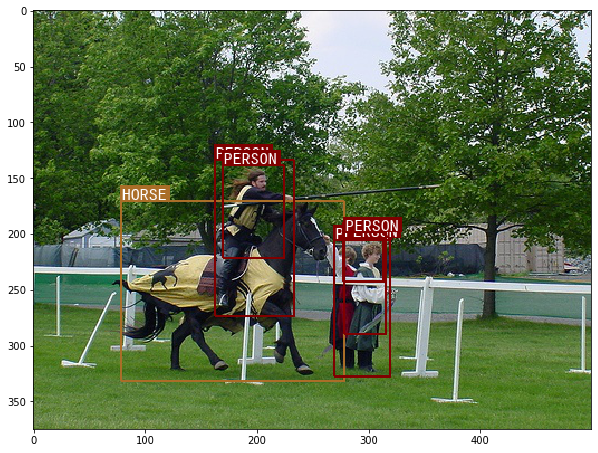

In [138]:
img_path = './data/VOCdevkit/VOC2007/JPEGImages/000009.jpg'
original_image = Image.open(img_path, mode='r')
original_image = original_image.convert('RGB')
anno_img = detect(original_image, min_score=0.2, max_overlap=0.5, top_k=200)
plt.figure(figsize=(10,10))
plt.imshow(anno_img)
plt.show()